In [1]:
import os
import cv2
import time
import random
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as T
from torchvision.utils import make_grid
from torchvision.models import resnet50

from sklearn.model_selection import train_test_split

from PIL import Image

import matplotlib.pyplot as plt
%matplotlib inline


### Importing the Dataset into Train and Test

In [2]:
DIR_TRAIN = "data/train/"
DIR_TEST = "data/test/"

### Checking Data Format

In [3]:
imgs = os.listdir(DIR_TRAIN) 
test_imgs = os.listdir(DIR_TEST)

print(imgs[:5])
print(test_imgs[:5])

['non_start_perthVSmel_2784.png', 'non_start_perthVSmel_110.png', 'non_start_perthVSmel_1655.png', 'start_melVSsyd_1202.png', 'start_melVSsyd_383.png']
['start_melVSsyd_383.png', 'start_melVSsyd_495.png', 'start_melVSsyd_353.png', 'non_start_melVSsyd_1308.png', 'start_melVSsyd_378.png']


### Class distribution in dataset

In [4]:
start_list = [img for img in imgs if img.split("_")[0] == "start"]
non_start_list = [img for img in imgs if img.split("_")[0] == "non"]

print("No of positive samples: ",len(start_list))
print("No of negative samples: ",len(non_start_list))

class_to_int = {"non" : 0, "start" : 1}
int_to_class = {0 : "non", 1 : "start"}

No of positive samples:  832
No of negative samples:  1000


### Transforms for image - ToTensor and other augmentations

In [5]:
def get_train_transform():
    return T.Compose([
        T.RandomHorizontalFlip(p=0.5),
        #T.RandomRotation(15),
        #T.RandomCrop(204),
        T.ToTensor(),
        T.Normalize((0, 0, 0),(1, 1, 1))
    ])
    
def get_val_transform():
    return T.Compose([
        T.ToTensor(),
        T.Normalize((0, 0, 0),(1, 1, 1))
    ])

### Dataset Class - for retrieving images and labels

In [6]:
class CatDogDataset(Dataset):
    
    def __init__(self, imgs, class_to_int, mode = "train", transforms = None):
        
        super().__init__()
        self.imgs = imgs
        self.class_to_int = class_to_int
        self.mode = mode
        self.transforms = transforms
        
    def __getitem__(self, idx):
        
        image_name = self.imgs[idx]
        
        ### Reading, converting and normalizing image
        #img = cv2.imread(DIR_TRAIN + image_name, cv2.IMREAD_COLOR)
        #img = cv2.resize(img, (224,224))
        #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        #img /= 255.
        img = Image.open(DIR_TRAIN + image_name)
        img = img.resize((160, 128)).convert('RGB')#224,224
        
        if self.mode == "train" or self.mode == "val":
        
            ### Preparing class label
            label = self.class_to_int[image_name.split("_")[0]]
            label = torch.tensor(label, dtype = torch.float32)

            ### Apply Transforms on image
            img = self.transforms(img)

            return image_name, img, label
        
        elif self.mode == "test":
            
            ### Apply Transforms on image
            img = self.transforms(img)

            return img
            
        
    def __len__(self):
        return len(self.imgs)
    

### Splitting data into training set and validation sets

In [7]:
train_imgs, val_imgs = train_test_split(imgs, test_size = 0.25)

In [91]:
len(val_images)

458

### Prepare dataset for training model:

In [8]:
train_dataset = CatDogDataset(train_imgs, class_to_int, mode = "train", transforms = get_train_transform())
val_dataset = CatDogDataset(val_imgs, class_to_int, mode = "val", transforms = get_val_transform())
test_dataset = CatDogDataset(test_imgs, class_to_int, mode = "test", transforms = get_val_transform())

In [9]:
train_data_loader = DataLoader(
    dataset = train_dataset,
    num_workers = 4,
    batch_size = 16,
    shuffle = True
)

In [10]:
val_data_loader = DataLoader(
    dataset = val_dataset,
    num_workers = 4,
    batch_size = 16,
    shuffle = True
)

In [11]:
test_data_loader = DataLoader(
    dataset = test_dataset,
    num_workers = 4,
    batch_size = 16,
    shuffle = True
)

### Visualize some Random Images from Training set

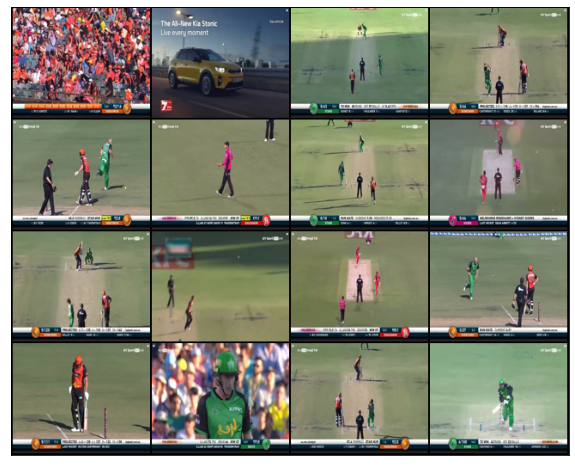

In [13]:
for _, images, labels in train_data_loader:
    
    fig, ax = plt.subplots(figsize = (10, 10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, 4).permute(1,2,0))
    break
    

### Check for GPU availability

In [14]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    

/opt/conda/lib/python3.8/site-packages/torch/cuda/__init__.py:82: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:112.)
  return torch._C._cuda_getDeviceCount() > 0


### Define a Function to train over Epoch

In [15]:
def train_one_epoch(train_data_loader):
    
    ### Local Parameters
    epoch_loss = []
    epoch_acc = []
    start_time = time.time()
    
    ###Iterating over data loader
    for _, images, labels in train_data_loader:
        
        #Loading images and labels to device
        images = images.to(device)
        labels = labels.to(device)
        labels = labels.reshape((labels.shape[0], 1)) # [N, 1] - to match with preds shape
        
        #Reseting Gradients
        optimizer.zero_grad()
        
        #Forward
        preds = model(images)
        
        #Calculating Loss
        _loss = criterion(preds, labels)
        loss = _loss.item()
        epoch_loss.append(loss)
        
        #Calculating Accuracy
        acc = accuracy(preds, labels)
        epoch_acc.append(acc)
        
        #Backward
        _loss.backward()
        optimizer.step()
    
    ###Overall Epoch Results
    end_time = time.time()
    total_time = end_time - start_time
    
    ###Acc and Loss
    epoch_loss = np.mean(epoch_loss)
    epoch_acc = np.mean(epoch_acc)
    
    ###Storing results to logs
    train_logs["loss"].append(epoch_loss)
    train_logs["accuracy"].append(epoch_acc)
    train_logs["time"].append(total_time)
        
    return epoch_loss, epoch_acc, total_time
        

### Define a Function over Validation - One Epoch

In [16]:
def val_one_epoch(val_data_loader, best_val_acc):
    
    ### Local Parameters
    epoch_loss = []
    epoch_acc = []
    start_time = time.time()
    
    ###Iterating over data loader
    for _,images, labels in val_data_loader:
        
        #Loading images and labels to device
        images = images.to(device)
        labels = labels.to(device)
        labels = labels.reshape((labels.shape[0], 1)) # [N, 1] - to match with preds shape
        
        #Forward
        preds = model(images)
        
        #Calculating Loss
        _loss = criterion(preds, labels)
        loss = _loss.item()
        epoch_loss.append(loss)
        
        #Calculating Accuracy
        acc = accuracy(preds, labels)
        epoch_acc.append(acc)
    
    ###Overall Epoch Results
    end_time = time.time()
    total_time = end_time - start_time
    
    ###Acc and Loss
    epoch_loss = np.mean(epoch_loss)
    epoch_acc = np.mean(epoch_acc)
    
    ###Storing results to logs
    val_logs["loss"].append(epoch_loss)
    val_logs["accuracy"].append(epoch_acc)
    val_logs["time"].append(total_time)
    
    ###Saving best model
    if epoch_acc > best_val_acc:
        best_val_acc = epoch_acc
        torch.save(model.state_dict(),"best_model.pth")
        
    return epoch_loss, epoch_acc, total_time, best_val_acc
        

### RESNET50 Pretrained Model

Resnet models were proposed in “Deep Residual Learning for Image Recognition”. Here we have the 5 versions of resnet models, which contains 5, 34, 50, 101, 152 layers respectively. 
We are using ResNet 50 model.

(Check Reference: 1)

In [ ]:
# model = resnet50(pretrained = True)

# # Modifying Head - classifier

# model.fc = nn.Sequential(
#     nn.Linear(2048, 1, bias = True),
#     nn.Sigmoid()
# )



from collections import OrderedDict

class NeuralNet(nn.Module):
    def __init__(self):
        super(NeuralNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3)
        self.conv2 = nn.Conv2d(32,32,kernel_size=3)
        self.conv3 = nn.Conv2d(32,64, kernel_size=3)
        self.pool = nn.MaxPool2d(2)
        self.hidden= nn.Linear(64*18*14, 64)
        self.drop = nn.Dropout(0.5)
        self.out = nn.Linear(64, 1)
        self.relu = nn.ReLU()
        self.sig = nn.Sigmoid()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(x) 
        
        x = self.relu(self.conv2(x)) 
        x = self.pool(x)
        
        x = self.relu(self.conv3(x)) 
        x = self.pool(x)
        x = x.view(x.size(0), -1) # [batch_size, 64*18*14=16128]
        
        
        x = self.relu(self.hidden(x))
        x = self.drop(x)
        
        x = self.sig(self.out(x))
        return x


model = NeuralNet()


### Defining model parameters


In [22]:
# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)

# Learning Rate Scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 5, gamma = 0.5)

#Loss Function
criterion = nn.BCELoss()

# Logs - Helpful for plotting after training finishes
train_logs = {"loss" : [], "accuracy" : [], "time" : []}
val_logs = {"loss" : [], "accuracy" : [], "time" : []}

# Loading model to device
model.to(device)

# No of epochs 
epochs = 20

### Training

In [23]:
best_val_acc = 0
for epoch in range(epochs):
    
    ###Training
    loss, acc, _time = train_one_epoch(train_data_loader)
    
    #Print Epoch Details
    print("\nTraining")
    print("Epoch {}".format(epoch+1))
    print("Loss : {}".format(round(loss, 4)))
    print("Acc : {}".format(round(acc, 4)))
    print("Time : {}".format(round(_time, 4)))
    
    ###Validation
    loss, acc, _time, best_val_acc = val_one_epoch(val_data_loader, best_val_acc)
    
    #Print Epoch Details
    print("\nValidating")
    print("Epoch {}".format(epoch+1))
    print("Loss : {}".format(round(loss, 4)))
    print("Acc : {}".format(round(acc, 4)))
    print("Time : {}".format(round(_time, 4)))
    


Training
Epoch 1
Loss : 0.0937
Acc : 97.3733
Time : 14.3692

Validating
Epoch 1
Loss : 0.0973
Acc : 97.1983
Time : 1.3199

Training
Epoch 2
Loss : 0.075
Acc : 97.5291
Time : 16.2803

Validating
Epoch 2
Loss : 0.0891
Acc : 97.5
Time : 1.3879

Training
Epoch 3
Loss : 0.0816
Acc : 97.581
Time : 15.1274

Validating
Epoch 3
Loss : 0.1141
Acc : 97.7155
Time : 1.3185

Training
Epoch 4
Loss : 0.073
Acc : 98.0378
Time : 14.9663

Validating
Epoch 4
Loss : 0.1067
Acc : 97.6293
Time : 1.4103

Training
Epoch 5
Loss : 0.0714
Acc : 98.1831
Time : 13.0231

Validating
Epoch 5
Loss : 0.1108
Acc : 97.4138
Time : 1.2631

Training
Epoch 6
Loss : 0.0699
Acc : 98.1001
Time : 16.3311

Validating
Epoch 6
Loss : 0.1311
Acc : 97.7155
Time : 1.4711

Training
Epoch 7
Loss : 0.0756
Acc : 98.3181
Time : 14.5168

Validating
Epoch 7
Loss : 0.1173
Acc : 97.2845
Time : 1.3692

Training
Epoch 8
Loss : 0.0619
Acc : 98.6088
Time : 16.3588

Validating
Epoch 8
Loss : 0.1076
Acc : 97.931
Time : 1.2991

Training
Epoch 9
Loss 

### Lets Plot The Accuracies and Losses

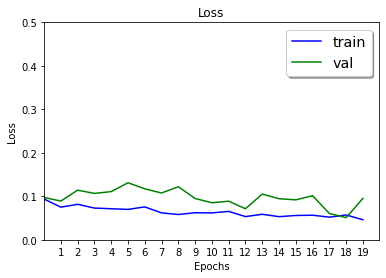

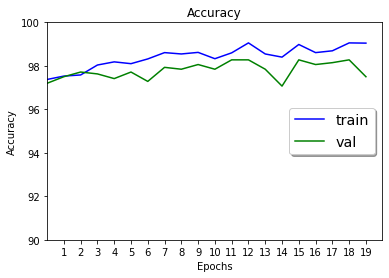

In [69]:
### Plotting Results

#Loss
plt.title("Loss")
plt.plot(np.arange(0, 20, 1), train_logs["loss"], color = 'blue', label='train')
plt.plot(np.arange(0, 20, 1), val_logs["loss"], color = 'green', label='val')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xlim([0, None])
plt.xticks(list(range(1,20)))
plt.ylim([0,0.5])
legend = plt.legend(loc='upper right', shadow=True, fontsize='x-large')
plt.show()

#Accuracy
plt.title("Accuracy")
plt.plot(np.arange(0, 20, 1), train_logs["accuracy"], color = 'blue', label='train')
plt.plot(np.arange(0, 20, 1), val_logs["accuracy"], color = 'green', label='val')
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.ylim([90,100])
plt.xlim([0,None])
plt.xticks(list(range(1,20)))
legend = plt.legend(loc='center right', shadow=True, fontsize='x-large')
plt.show()



In [52]:
model = NeuralNet()
model.load_state_dict(torch.load('resnet50_best.pth'))
model.eval()

NeuralNet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (hidden): Linear(in_features=16128, out_features=64, bias=True)
  (drop): Dropout(p=0.5, inplace=False)
  (out): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
  (sig): Sigmoid()
)

In [53]:
device='cpu'
val_preds = []
val_labels = []
val_images = []
for image_names, images, labels in val_data_loader:
        
        #Loading images and labels to device
        images = images.to(device)
        labels = labels.to(device)
        labels = labels.reshape((labels.shape[0], 1)) # [N, 1] - to match with preds shape
        val_labels.extend(labels.detach().numpy())
        
        #forward
        preds = model(images)
        val_preds.extend(preds.detach().numpy())
        val_images.extend(image_names)
        

In [101]:
### Define a function to calculate accuracy

def accuracy(_preds, trues, val_images):
    
    ### Converting preds to 0 or 1
    preds = [1 if _preds[i] >= 0.5 else 0 for i in range(len(_preds))]
    
    acc = []
    false_images = []
    false_scores = []
    false_class = []
    ### Calculating accuracy by comparing predictions with true labels
    for i in range(len(preds)):
        if preds[i] == trues[i]:
            acc.append(1)
        else:
            acc.append(0)
            false_images.append(val_images[i])
            false_scores.append(_preds[i][0]) if _preds[i][0] >=0.5 else false_scores.append(1-_preds[i][0])
            false_class.append(preds[i])
    ### Summing over all correct predictions
    acc = np.sum(acc) / len(preds)
    
    return (acc * 100), false_images, false_scores, false_class
    

In [102]:
#Calculating Accuracy
acc, false_images, false_scores, false_class = accuracy(val_preds, val_labels, val_images)
print(acc, false_images, false_scores, false_class)

98.2532751091703 ['non_start_perthVSmel_10321.png', 'non_start_perthVSmel_8151.png', 'start_perthVSmel_5691.png', 'non_start_perthVSmel_9996.png', 'non_start_perthVSmel_4615.png', 'non_start_perthVSmel_8777.png', 'non_start_perthVSmel_10148.png', 'non_start_perthVSmel_10381.png'] [0.98652995, 0.72583747, 0.607890248298645, 0.9843264, 0.94828266, 0.9605949, 0.9933868, 0.9523081] [1, 1, 0, 1, 1, 1, 1, 1]


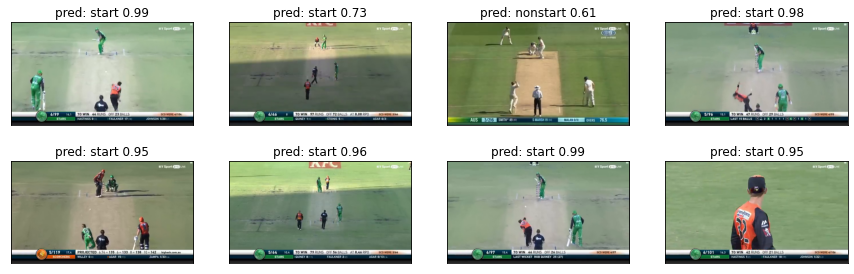

In [104]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(15., 15.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 4),  # creates 2x2 grid of axes
                 axes_pad=0.5,  # pad between axes in inch.
                 )

for i, (ax, im) in enumerate(zip(grid, false_images)):
    # Iterating over the grid returns the Axes.
    im = plt.imread('data/train/'+im)
    title = 'pred: start '+str(round(false_scores[i],2)) if false_class[i] == 1 else 'pred: nonstart '+str(round(false_scores[i],2))
    ax.set_title(title, fontdict=None, loc='center', color = "k")
    ax.imshow(im)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

In [82]:
def load_image(img_path, show=False):

#     img = image.load_img(img_path, target_size=(200, 160))
    img = Image.open(img_path)
    img = img.resize((200,160)).convert('RGB')

    if show:
        plt.imshow(img)                           
        plt.axis('off')
        plt.show()
        
    return img

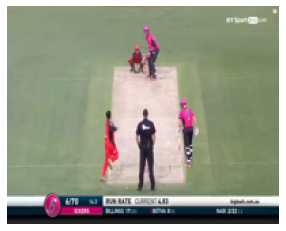

true: [1.]
pred: [0.97035664]


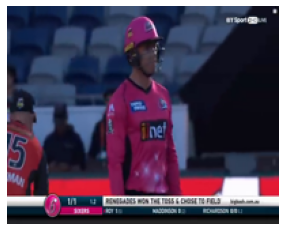

true: [0.]
pred: [0.00108888]


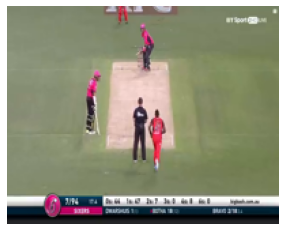

true: [1.]
pred: [0.9985079]


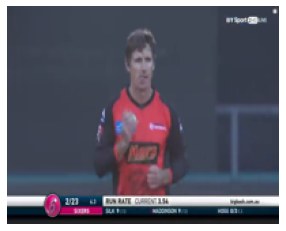

true: [0.]
pred: [0.00038243]


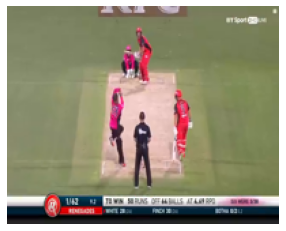

true: [1.]
pred: [0.9992206]


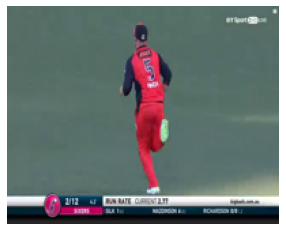

true: [0.]
pred: [0.00020585]


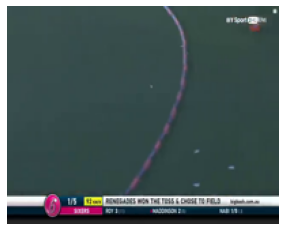

true: [0.]
pred: [0.00044723]


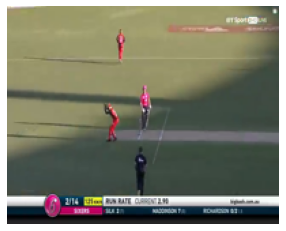

true: [0.]
pred: [0.00569448]


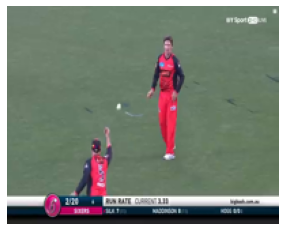

true: [0.]
pred: [0.00055831]


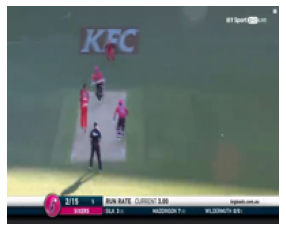

true: [0.]
pred: [0.04463844]


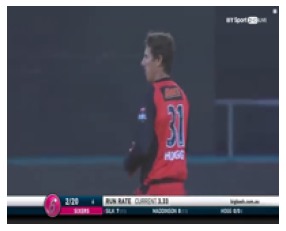

true: [0.]
pred: [0.00106889]


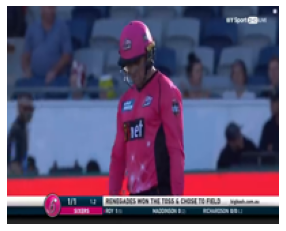

true: [0.]
pred: [0.00138857]


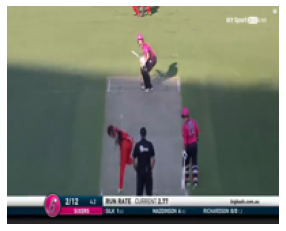

true: [1.]
pred: [0.99548787]


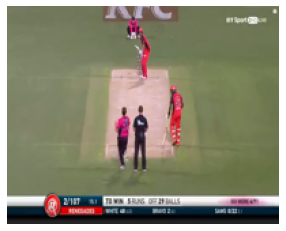

true: [1.]
pred: [0.9978654]


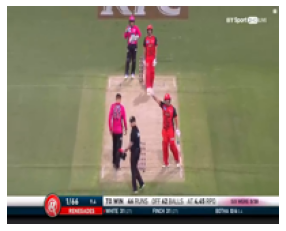

true: [1.]
pred: [0.9964928]


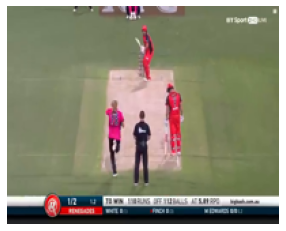

true: [1.]
pred: [0.9995122]


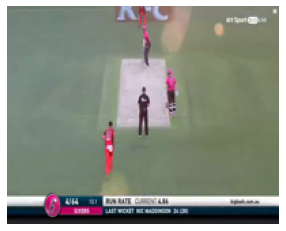

true: [1.]
pred: [0.9964407]


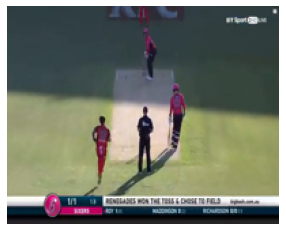

true: [1.]
pred: [0.9989496]


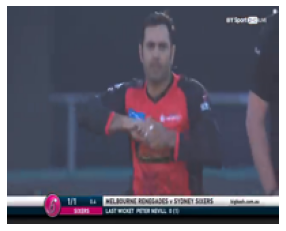

true: [0.]
pred: [0.00019179]


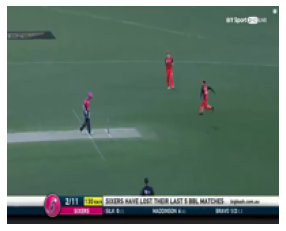

true: [0.]
pred: [0.00077718]


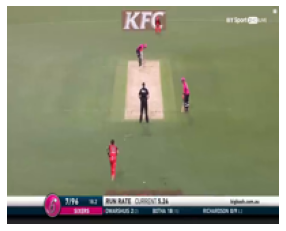

true: [1.]
pred: [0.984757]


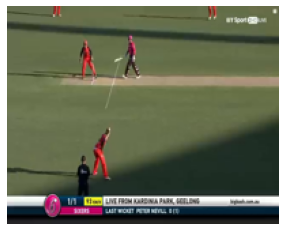

true: [0.]
pred: [0.00107299]


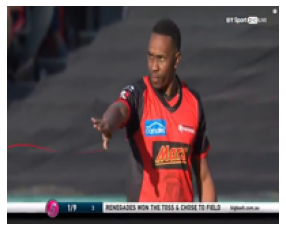

true: [0.]
pred: [0.00019255]


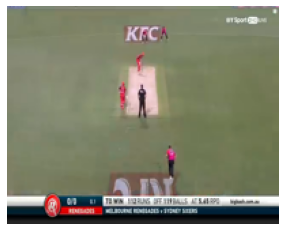

true: [1.]
pred: [0.99865985]


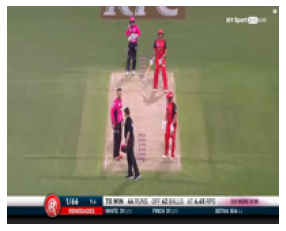

true: [1.]
pred: [0.99303025]


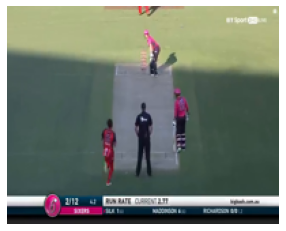

true: [1.]
pred: [0.99782854]


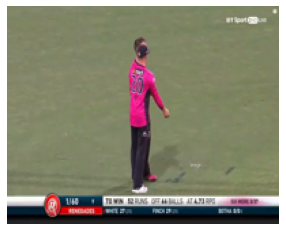

true: [1.]
pred: [0.9597437]


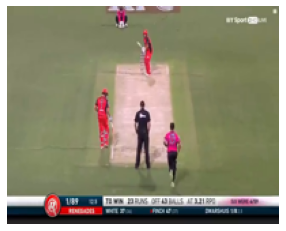

true: [1.]
pred: [0.9995772]


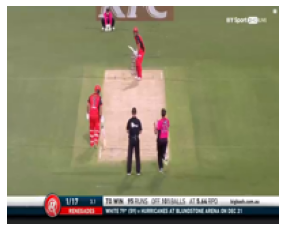

true: [1.]
pred: [0.9998012]


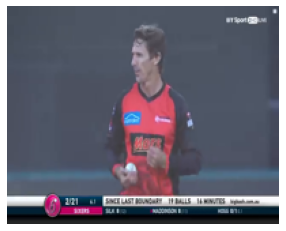

true: [0.]
pred: [0.00173287]


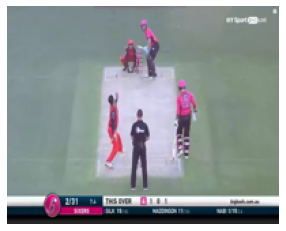

true: [1.]
pred: [0.99928385]


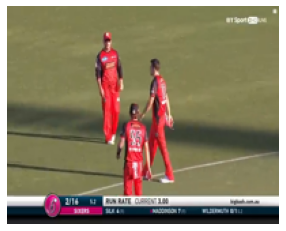

true: [0.]
pred: [0.00148533]


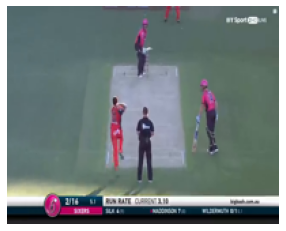

true: [1.]
pred: [0.99506724]


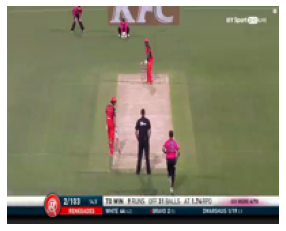

true: [1.]
pred: [0.9997694]


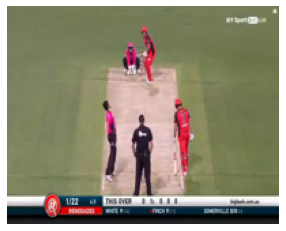

true: [1.]
pred: [0.9978263]


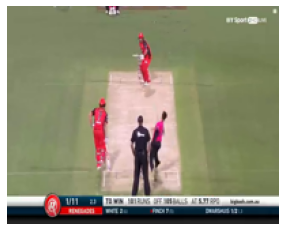

true: [1.]
pred: [0.9994155]


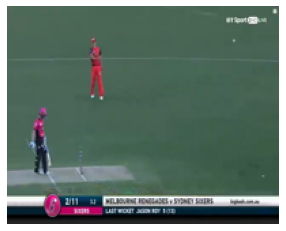

true: [0.]
pred: [0.00076483]


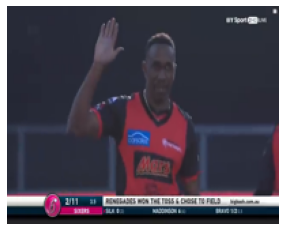

true: [0.]
pred: [0.0002947]


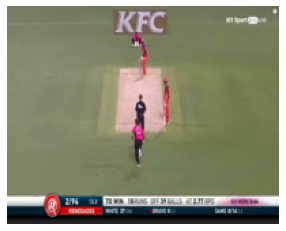

true: [1.]
pred: [0.9994248]


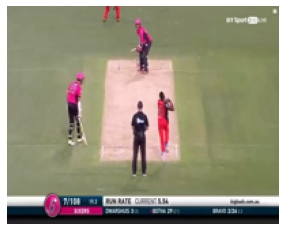

true: [1.]
pred: [0.99716884]


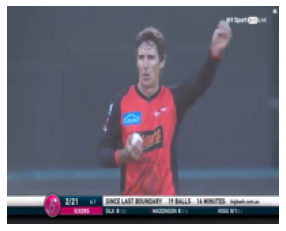

true: [0.]
pred: [0.00213478]


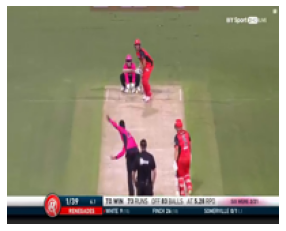

true: [1.]
pred: [0.99281764]


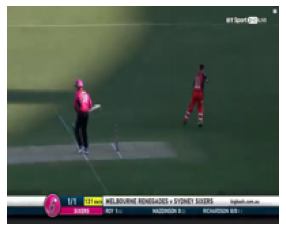

true: [0.]
pred: [0.00081939]


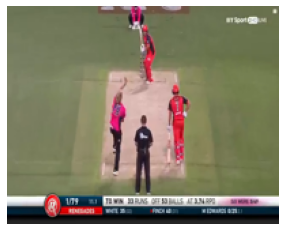

true: [1.]
pred: [0.9994586]


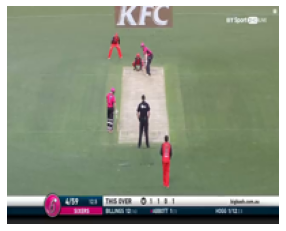

true: [1.]
pred: [0.9970253]


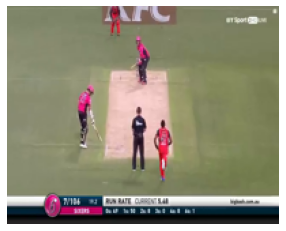

true: [1.]
pred: [0.9991093]


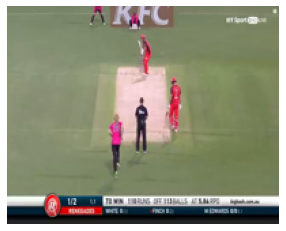

true: [1.]
pred: [0.99761605]


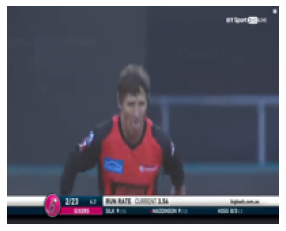

true: [0.]
pred: [0.0001566]


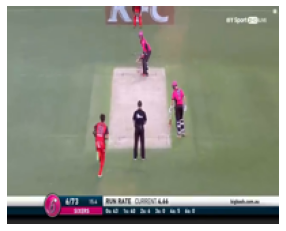

true: [1.]
pred: [0.99963415]


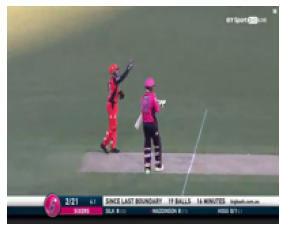

true: [0.]
pred: [0.00832514]


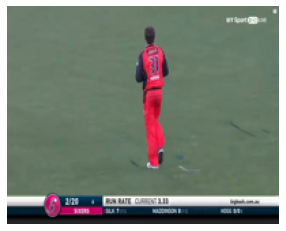

true: [0.]
pred: [0.00019966]


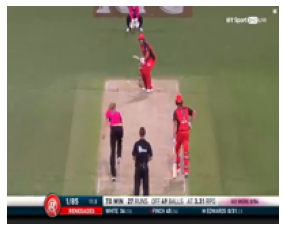

true: [1.]
pred: [0.9996662]


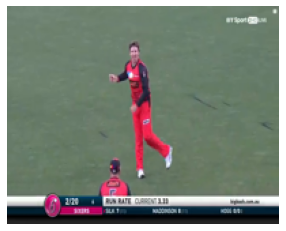

true: [0.]
pred: [0.0004083]


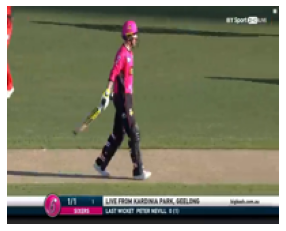

true: [0.]
pred: [0.00092514]


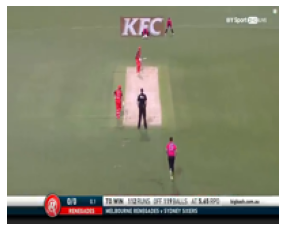

true: [1.]
pred: [0.9990232]


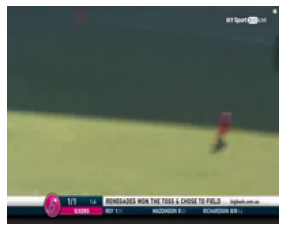

true: [0.]
pred: [0.00033437]


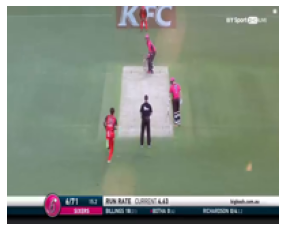

true: [1.]
pred: [0.99841785]


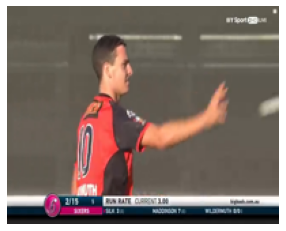

true: [0.]
pred: [0.00247993]


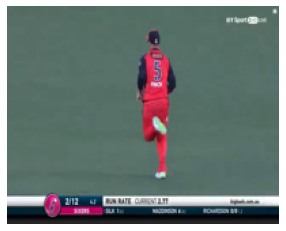

true: [0.]
pred: [0.00016348]


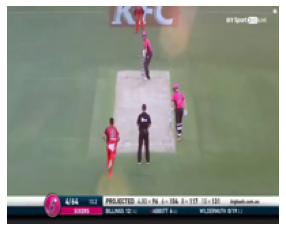

true: [1.]
pred: [0.99928325]


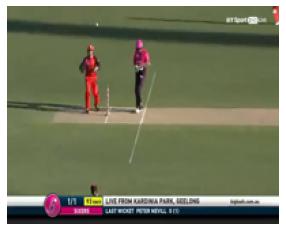

true: [0.]
pred: [0.00185527]


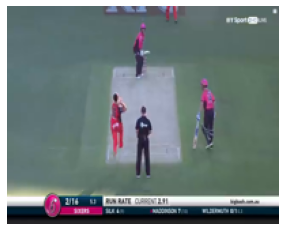

true: [1.]
pred: [0.9987206]


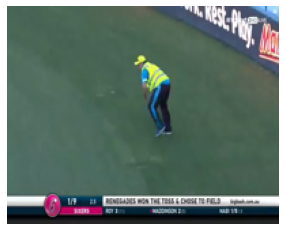

true: [0.]
pred: [0.00084813]


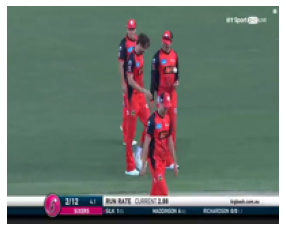

true: [0.]
pred: [0.00069967]


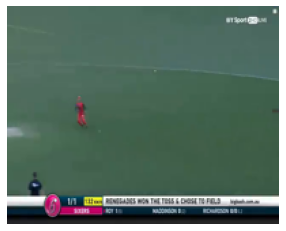

true: [0.]
pred: [0.00027007]


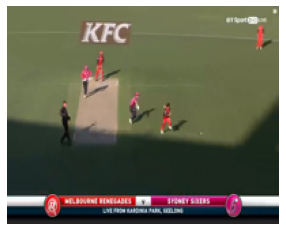

true: [0.]
pred: [0.042374]


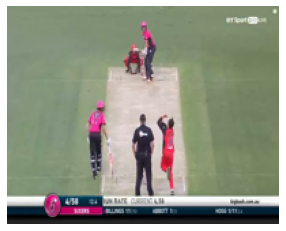

true: [1.]
pred: [0.9983271]


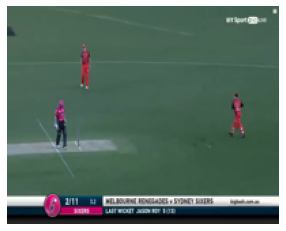

true: [0.]
pred: [0.00083141]


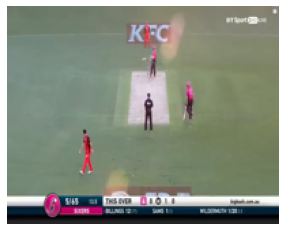

true: [1.]
pred: [0.99757856]


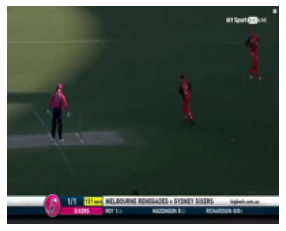

true: [0.]
pred: [0.00041782]


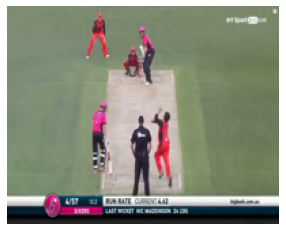

true: [1.]
pred: [0.9987826]


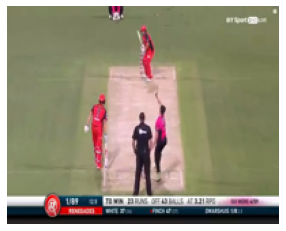

true: [1.]
pred: [0.99994576]


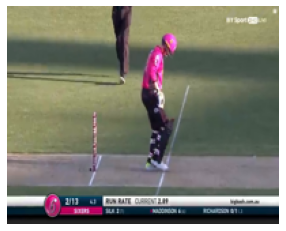

true: [0.]
pred: [0.00519924]


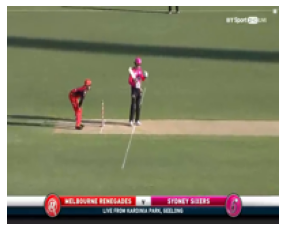

true: [0.]
pred: [0.00199597]


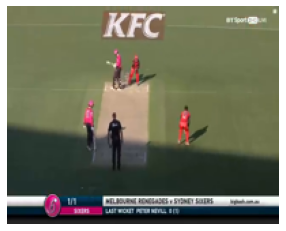

true: [0.]
pred: [0.08485417]


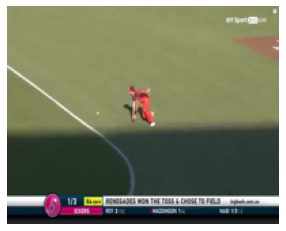

true: [0.]
pred: [0.00137937]


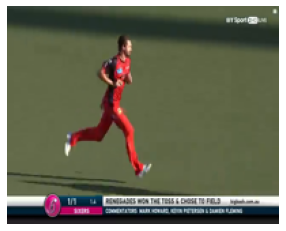

true: [0.]
pred: [0.00316368]


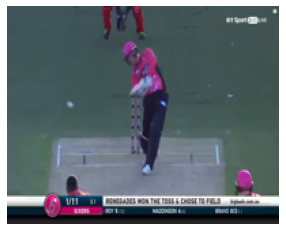

true: [0.]
pred: [0.00155103]


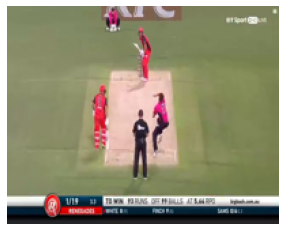

true: [1.]
pred: [0.999681]


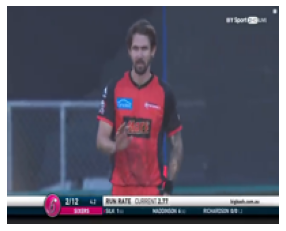

true: [0.]
pred: [0.00044067]


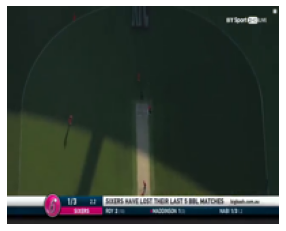

true: [0.]
pred: [6.450154e-05]


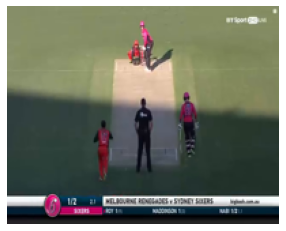

true: [0.]
pred: [0.0241018]


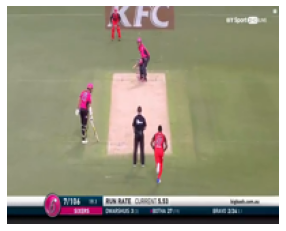

true: [1.]
pred: [0.99959725]


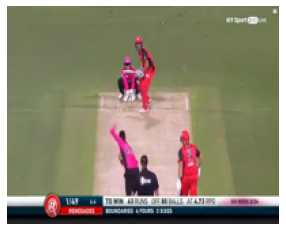

true: [1.]
pred: [0.9879979]


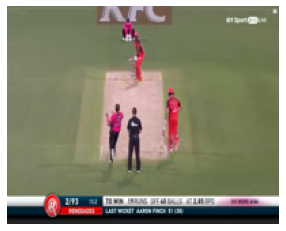

true: [1.]
pred: [0.9989029]


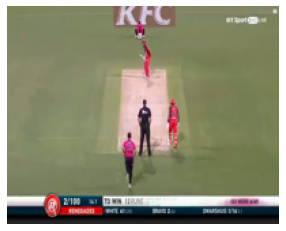

true: [1.]
pred: [0.99931026]


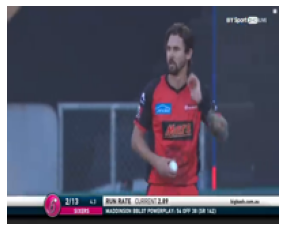

true: [0.]
pred: [0.00062978]


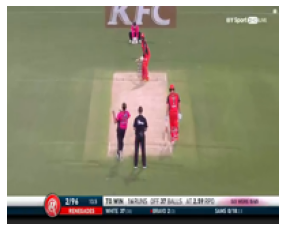

true: [1.]
pred: [0.9973016]


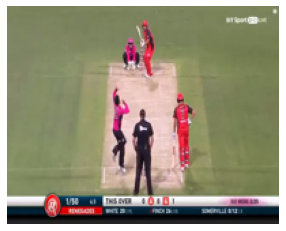

true: [1.]
pred: [0.99541473]


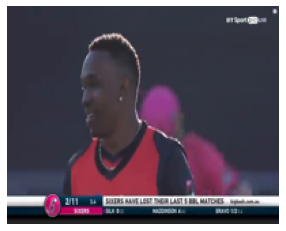

true: [0.]
pred: [0.0013091]


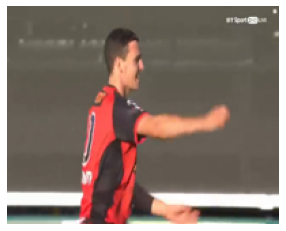

true: [0.]
pred: [0.00303543]


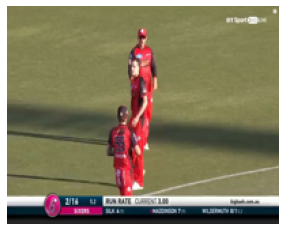

true: [0.]
pred: [0.00122432]


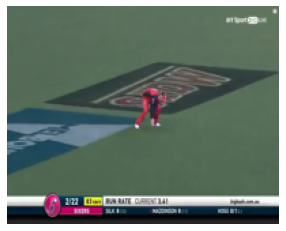

true: [0.]
pred: [0.00015692]


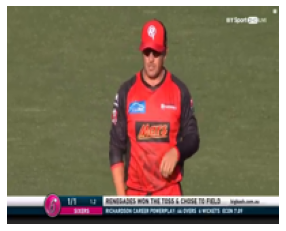

true: [0.]
pred: [0.00255262]


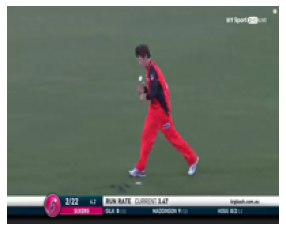

true: [0.]
pred: [0.00055886]


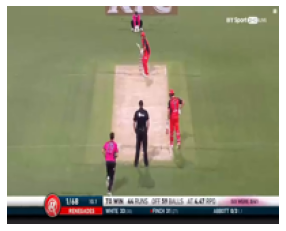

true: [1.]
pred: [0.9990145]


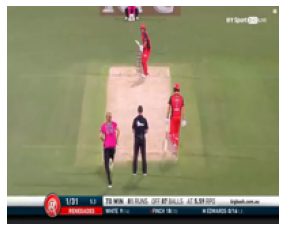

true: [1.]
pred: [0.9988342]


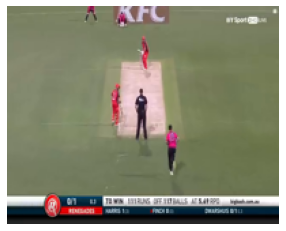

true: [1.]
pred: [0.99686795]


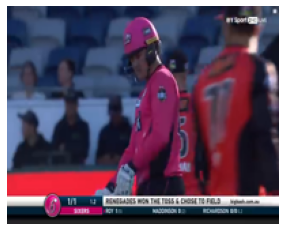

true: [0.]
pred: [0.00045908]


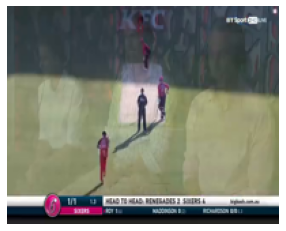

true: [0.]
pred: [0.00518843]


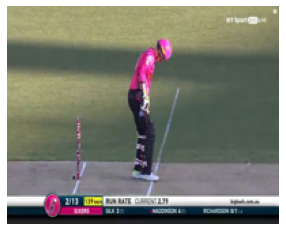

true: [0.]
pred: [0.00330751]


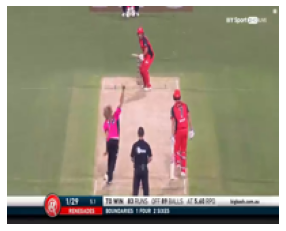

true: [1.]
pred: [0.9996196]


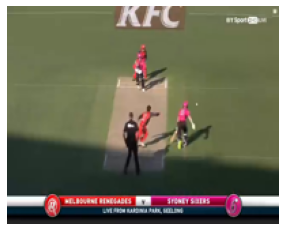

true: [1.]
pred: [0.934478]


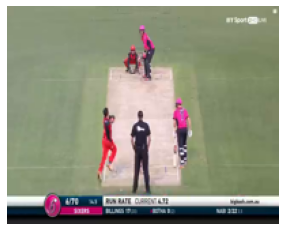

true: [1.]
pred: [0.9773731]


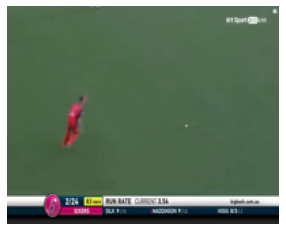

true: [0.]
pred: [0.00109835]


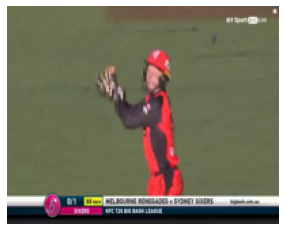

true: [0.]
pred: [0.00142156]


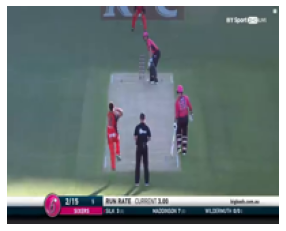

true: [1.]
pred: [0.9934729]


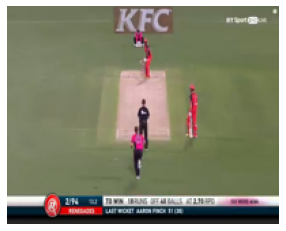

true: [1.]
pred: [0.9988053]


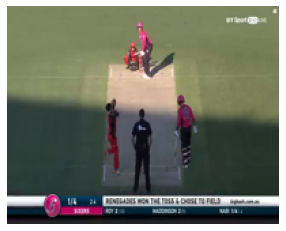

true: [0.]
pred: [0.03619942]


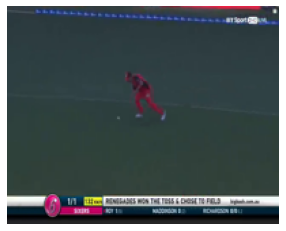

true: [0.]
pred: [0.00027824]


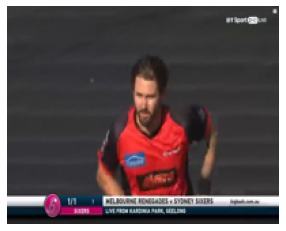

true: [0.]
pred: [0.00063623]


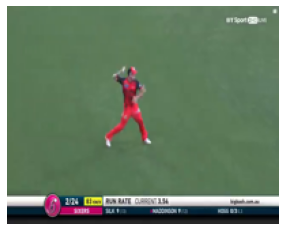

true: [0.]
pred: [0.00143812]


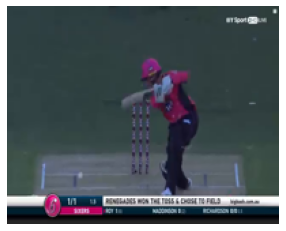

true: [0.]
pred: [0.0005447]


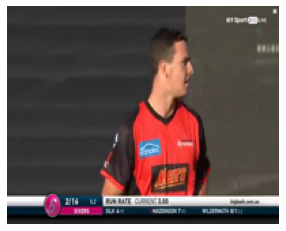

true: [0.]
pred: [0.00159599]


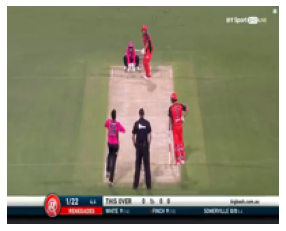

true: [1.]
pred: [0.99442357]


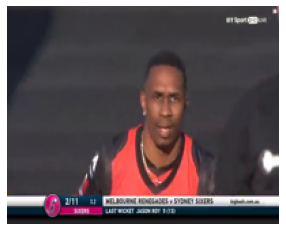

true: [0.]
pred: [0.00218957]


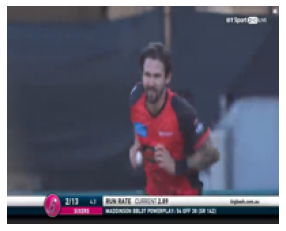

true: [0.]
pred: [0.00048027]


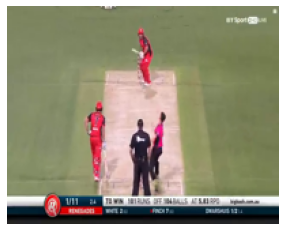

true: [1.]
pred: [0.9994504]


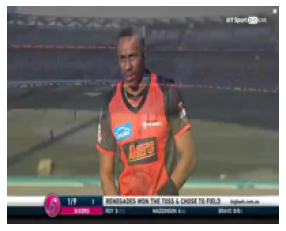

true: [0.]
pred: [0.0013564]


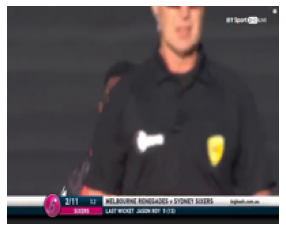

true: [0.]
pred: [0.00291162]


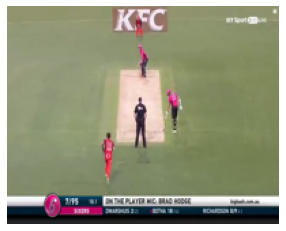

true: [1.]
pred: [0.99502486]


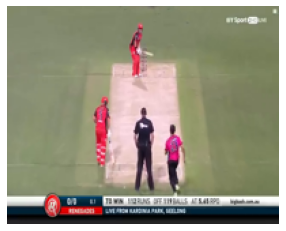

true: [1.]
pred: [0.99989736]


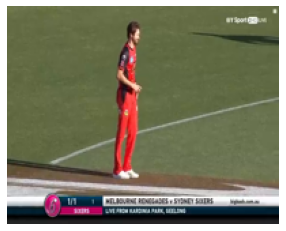

true: [0.]
pred: [0.00053603]


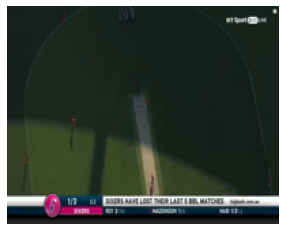

true: [0.]
pred: [8.555739e-05]


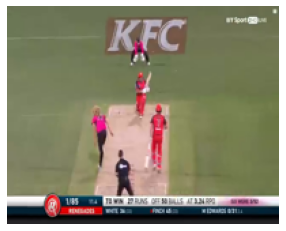

true: [1.]
pred: [0.99917275]


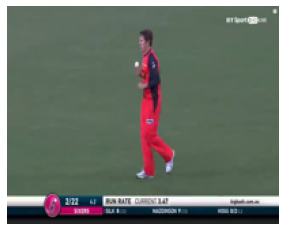

true: [0.]
pred: [0.00039486]


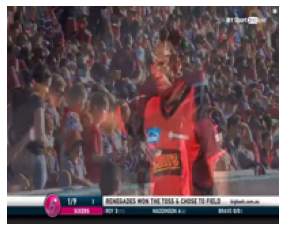

true: [0.]
pred: [0.00361187]


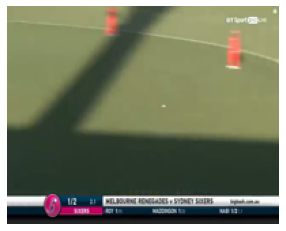

true: [0.]
pred: [0.00104642]


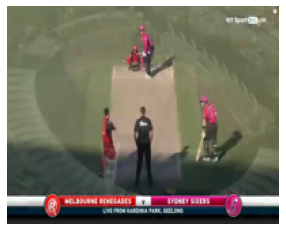

true: [1.]
pred: [0.9821737]


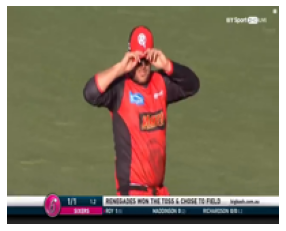

true: [0.]
pred: [0.00228414]


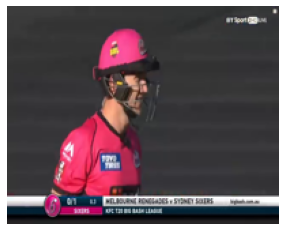

true: [0.]
pred: [0.00285895]


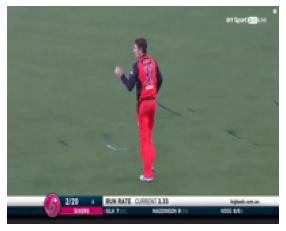

true: [0.]
pred: [0.00038464]


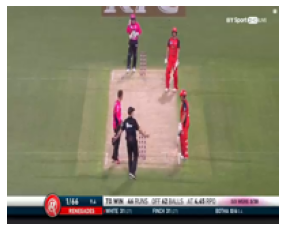

true: [1.]
pred: [0.932086]


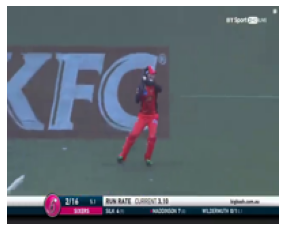

true: [0.]
pred: [0.00092318]


In [83]:
for i in range (0,len(val_images)):
    pic = load_image('data/train/'+str(val_images[i]),show=True)
    
    print('true: '+ str(val_labels[i]))
    print('pred: '+ str(val_preds[i]))

In [108]:
count = 0
for i in val_imgs:
    if 'non' not in i:
        count+=1
count

194